In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

In [ ]:
from statsmodels.tsa.stattools import adfuller  # 0.9.0
import statsmodels.api as sm

In [ ]:
pip install statsmodels

You should consider upgrading via the 'c:\users\csuftitan\appdata\local\programs\python\python39\python.exe -m pip install --upgrade pip' command.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#Read the csv file
data = pd.read_csv('/content/drive/MyDrive/dataset.csv', index_col = 0)
data.head(5)

c:\users\csuftitan\appdata\local\programs\python\python39\lib\site-packages\numpy\lib\arraysetops.py:583: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


,ID,Latitude,Longitude,Year,Month,Day,Hour,Minute,DHI,DNI,...,Dew Point,Fill Flag,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Zipcode
0,78066,33.45,-117.66,2010,1,1,0,30,0,0,...,2.0,0,0,61.77,166.91,0.091,1020,1.640,71.3,92624
1,78066,33.45,-117.66,2010,1,1,1,30,0,0,...,1.0,0,0,58.43,156.51,0.091,1020,1.659,67.5,92624
2,78066,33.45,-117.66,2010,1,1,2,30,0,0,...,0.0,0,0,55.57,144.34,0.091,1020,1.676,68.4,92624
3,78066,33.45,-117.66,2010,1,1,3,30,0,0,...,0.0,0,0,54.06,131.85,0.091,1020,1.706,69.9,92624
4,78066,33.45,-117.66,2010,1,1,4,30,0,0,...,0.0,0,0,53.25,119.41,0.091,1020,1.756,71.8,92624


In [ ]:
data.tail()

,ID,Latitude,Longitude,Year,Month,Day,Hour,Minute,DHI,DNI,...,Dew Point,Fill Flag,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Zipcode
6044395,82394,33.93,-117.82,2019,12,31,19,30,0,0,...,-4.8,0,0,46.00,121.83,0.13,973,0.3,43.0,92823
6044396,82394,33.93,-117.82,2019,12,31,20,30,0,0,...,-4.9,0,0,47.42,134.23,0.13,974,0.3,41.0,92823
6044397,82394,33.93,-117.82,2019,12,31,21,30,0,0,...,-5.0,0,0,48.28,146.62,0.13,974,0.3,38.0,92823
6044398,82394,33.93,-117.82,2019,12,31,22,30,0,0,...,-5.3,0,0,48.35,158.52,0.13,975,0.3,36.0,92823
6044399,82394,33.93,-117.82,2019,12,31,23,30,0,0,...,-5.6,0,0,48.26,167.84,0.13,975,0.3,36.0,92823


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
data.shape

(6044400, 26)

In [ ]:
#Analysis of temperature based on each Zipcode and Date
temp_data = data[["Zipcode", 'Year', 'Month', 'Day',"Temperature","Precipitable Water", "Wind Speed", "Wind Direction"]]
temp_data.head(10)
Stat = temp_data.groupby(['Zipcode', 'Year', 'Month','Day']).mean()
print(Stat)

Stat.to_csv('monthly-mean-temp1.csv')



                        Temperature  Precipitable Water  Wind Speed  \
Zipcode Year Month Day                                                
90620   2010 1     1      12.916667            1.570167    3.125000   
                   2      15.500000            0.815958    3.362500   
                   3      14.750000            0.468542    3.350000   
                   4      14.500000            0.722042    2.170833   
                   5      14.875000            0.858625    1.833333   
...                             ...                 ...         ...   
92887   2019 12    27      7.304167            0.887500    1.375000   
                   28      6.812500            0.787500    1.650000   
                   29      7.612500            1.337500    1.458333   
                   30      8.316667            1.362500    3.000000   
                   31      9.720833            0.862500    3.495833   

                        Wind Direction  
Zipcode Year Month Day             

In [ ]:
#select columns required for the analysis
temp_data = data[["Zipcode", 'Year', 'Month', "Temperature"]]
temp_data.head(10)
Stat = temp_data.groupby(['Zipcode', 'Year', 'Month']).mean()
print(Stat)

                    Temperature
Zipcode Year Month             
90620   2010 1        12.985215
             2        12.605655
             3        13.672043
             4        13.744444
             5        16.360215
...                         ...
92887   2019 8        24.694220
             9        23.127639
             10       19.506317
             11       16.194306
             12       11.033602

[8280 rows x 1 columns]


In [ ]:
Stat.to_csv('monthly-mean-temp.csv')

In [ ]:
dat3 = pd.read_csv('monthly-mean-temp.csv')
dat3.head()

,Zipcode,Year,Month,Temperature
0,90620,2010,1,12.985215
1,90620,2010,2,12.605655
2,90620,2010,3,13.672043
3,90620,2010,4,13.744444
4,90620,2010,5,16.360215


In [ ]:
dat3['Day'] = 15

In [ ]:
dat3["Date"] = pd.to_datetime(dat3[['Year', 'Month', 'Day']])
dat3.set_index("Date", inplace=True)
dat3.drop(['Year', 'Month', 'Day'], axis=1, inplace=True)
dat3.head()

,Zipcode,Temperature
Date,,
2010-01-15,90620,12.985215
2010-02-15,90620,12.605655
2010-03-15,90620,13.672043
2010-04-15,90620,13.744444
2010-05-15,90620,16.360215


In [ ]:
temp_data = data[["Zipcode", 'Year', 'Month', "Temperature"]]
temp_data.head(10)
Stat = temp_data.groupby(['Zipcode', 'Year', 'Month']).mean()
print(Stat)

                    Temperature
Zipcode Year Month             
90620   2010 1        12.985215
             2        12.605655
             3        13.672043
             4        13.744444
             5        16.360215
...                         ...
92887   2019 8        24.694220
             9        23.127639
             10       19.506317
             11       16.194306
             12       11.033602

[8280 rows x 1 columns]


In [ ]:
dat3['Percentage_diff'] = dat3['Temperature'].pct_change()
dat3.head()

,Zipcode,Temperature,Percentage_diff
Date,,,
2010-01-15,90620,12.985215,NaN
2010-02-15,90620,12.605655,-0.029230
2010-03-15,90620,13.672043,0.084596
2010-04-15,90620,13.744444,0.005296
2010-05-15,90620,16.360215,0.190315


In [ ]:
zip_code = list(data["Zipcode"].unique())
print(zip_code)

[92624, 92674, 92629, 92675, 92651, 92677, 92656, 92694, 92693, 92663, 92661, 92625, 92657, 92637, 92653, 92691, 92646, 92627, 92617, 92612, 92658, 92618, 92630, 92688, 92679, 92648, 92708, 92626, 92614, 92604, 92610, 92678, 92530, 90743, 90742, 92647, 92655, 92704, 92707, 92780, 92602, 92676, 90740, 92845, 92844, 92843, 92706, 92866, 92705, 92883, 90720, 90630, 92804, 92802, 92861, 92869, 90623, 90620, 92801, 92805, 92806, 92807, 92808, 90621, 92831, 92870, 92886, 92887, 92823]


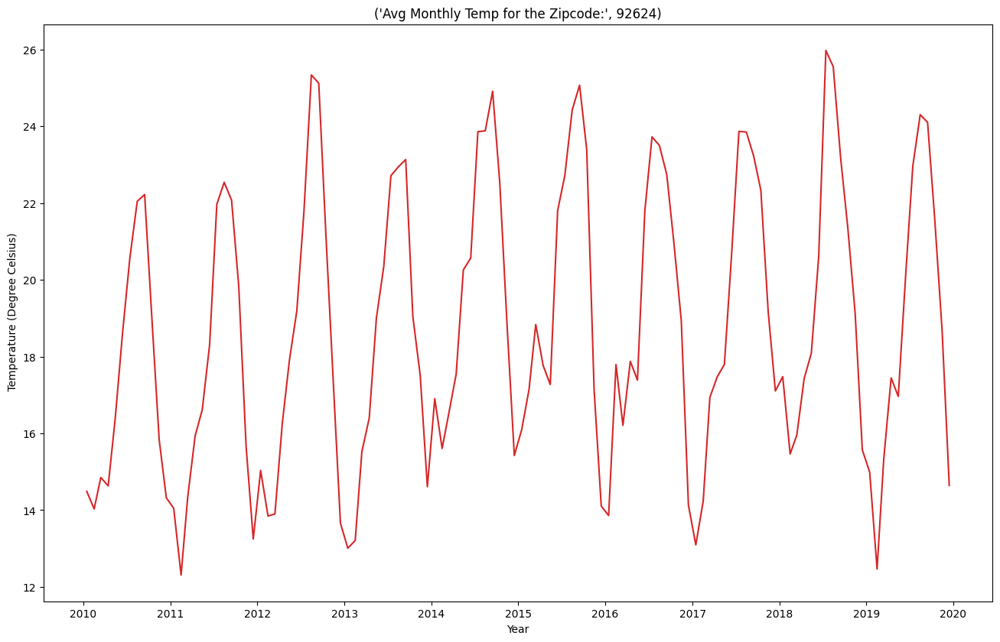

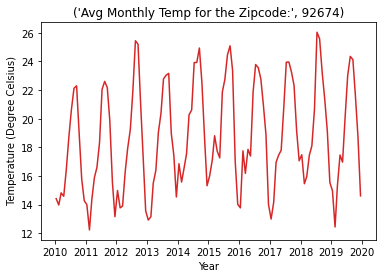

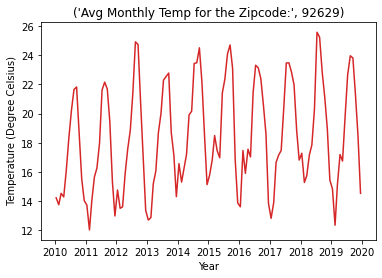

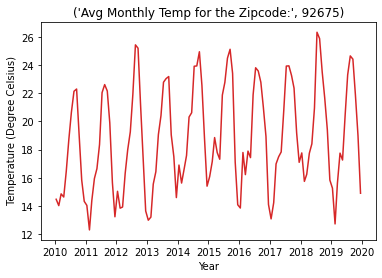

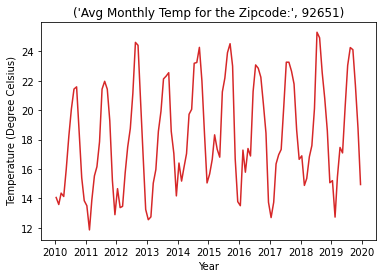

...

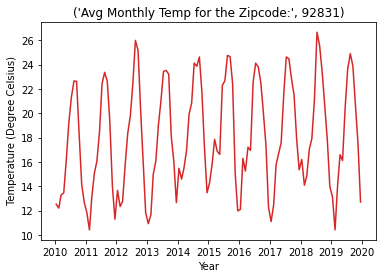

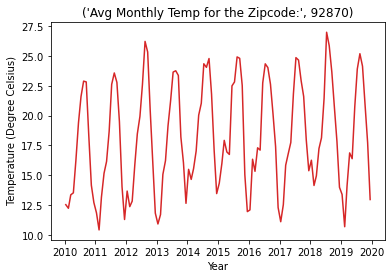

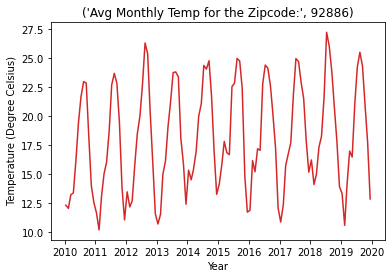

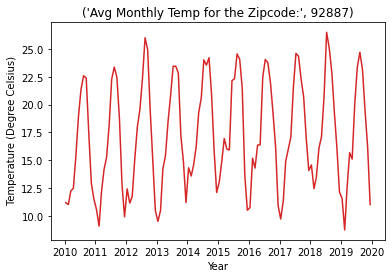

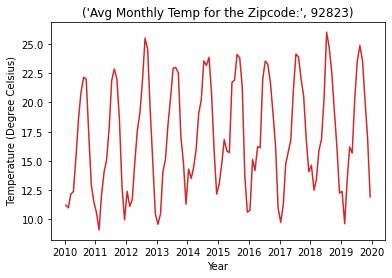

In [ ]:
plt.figure(figsize=(16,10), dpi=100)
for i in zip_code:
    mask = (dat3["Zipcode"] == i)
    dat4 = dat3.loc[mask]
    plt.plot(dat4.index, dat4.Temperature, color='tab:red')
    plt.gca().set(title=('Avg Monthly Temp for the Zipcode:', i), xlabel='Year', ylabel=" Temperature (Degree Celsius)")
    plt.show()
    i = i + 1
    

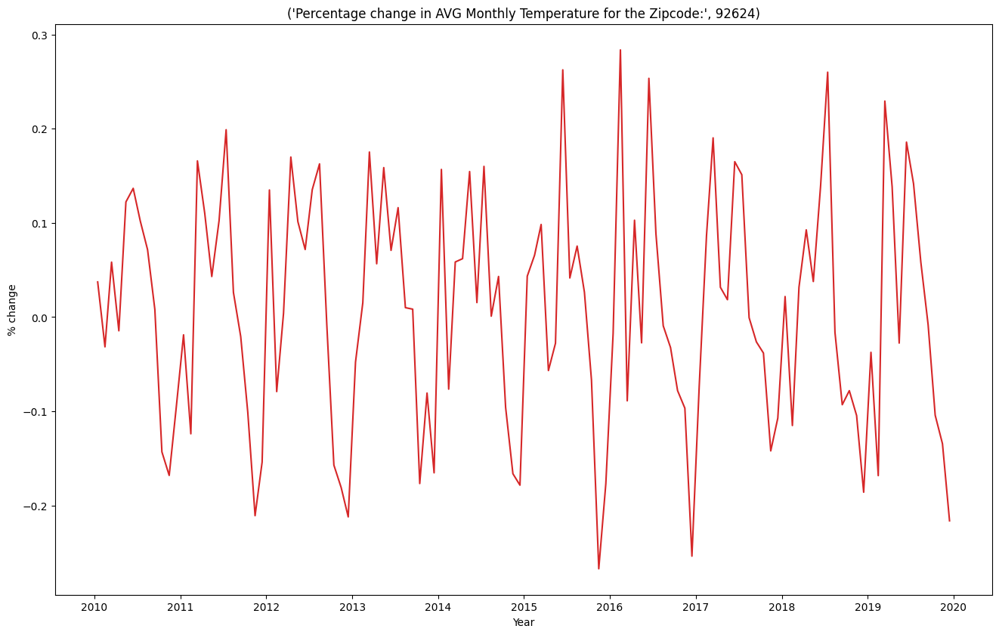

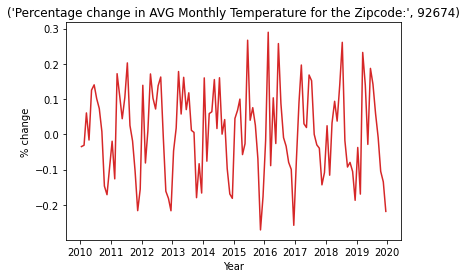

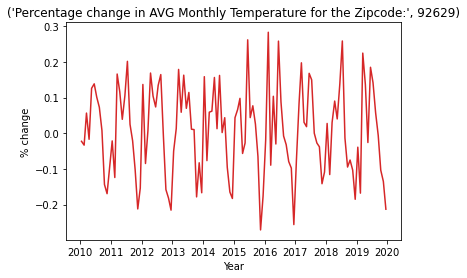

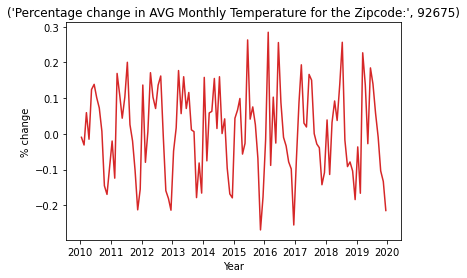

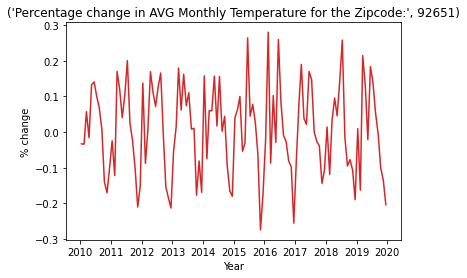

...

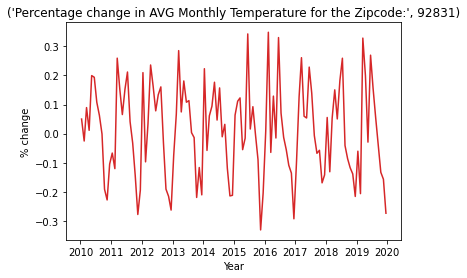

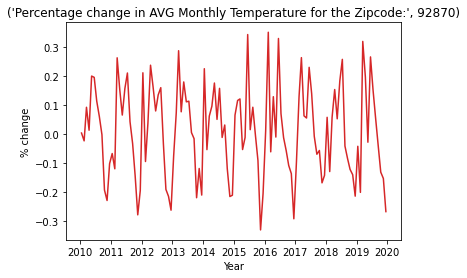

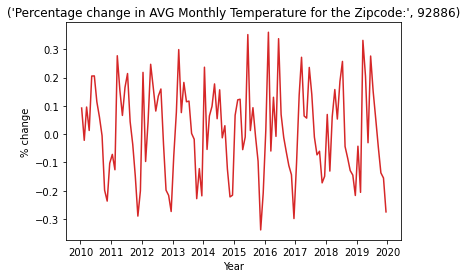

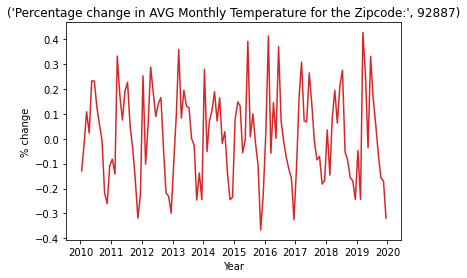

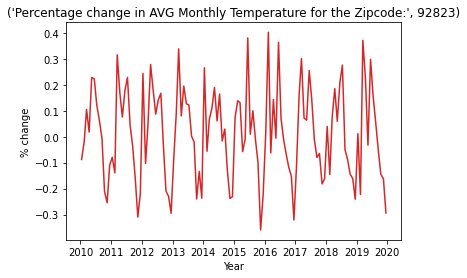

In [ ]:
plt.figure(figsize=(16,10), dpi=100)
#dat3.set_index("Year", inplace=True)
for i in zip_code:
  mask = (dat3["Zipcode"] == i) 
  dat4 = dat3.loc[mask]
  plt.plot(dat4.index, dat4.Percentage_diff, color='tab:red')
  plt.gca().set(title=('Percentage change in AVG Monthly Temperature for the Zipcode:', i), xlabel='Year', ylabel="% change")
  plt.show()
  i = i + 1

In [ ]:
#data.describe()
data.nunique()

ID                       69
Latitude                 13
Longitude                16
Year                     10
Month                    12
Day                      31
Hour                     24
Minute                    1
DHI                     511
DNI                    1050
Wind Speed              127
Temperature             425
Clearsky DHI            414
Clearsky DNI           1050
Clearsky GHI           1084
Cloud Type               11
Dew Point               383
Fill Flag                40
GHI                    1084
Relative Humidity      9315
Solar Zenith Angle    15818
Surface Albedo          143
Pressure                107
Precipitable Water     6378
Wind Direction         3601
Zipcode                  69
dtype: int64

In [ ]:
data.isnull().sum()
data = data.fillna(0)

In [ ]:
data.dtypes

ID                      int64
Latitude              float64
Longitude             float64
Year                    int64
Month                   int64
Day                     int64
Hour                    int64
Minute                  int64
DHI                     int64
DNI                     int64
Wind Speed            float64
Temperature           float64
Clearsky DHI            int64
Clearsky DNI            int64
Clearsky GHI            int64
Cloud Type              int64
Dew Point             float64
Fill Flag               int64
GHI                     int64
Relative Humidity     float64
Solar Zenith Angle    float64
Surface Albedo        float64
Pressure                int64
Precipitable Water    float64
Wind Direction        float64
Zipcode                 int64
dtype: object

In [ ]:
data.isnull().sum()

ID                    0
Latitude              0
Longitude             0
Year                  0
Month                 0
Day                   0
Hour                  0
Minute                0
DHI                   0
DNI                   0
Wind Speed            0
Temperature           0
Clearsky DHI          0
Clearsky DNI          0
Clearsky GHI          0
Cloud Type            0
Dew Point             0
Fill Flag             0
GHI                   0
Relative Humidity     0
Solar Zenith Angle    0
Surface Albedo        0
Pressure              0
Precipitable Water    0
Wind Direction        0
Zipcode               0
dtype: int64

In [ ]:
#to convert the categorical data to numerical data, we use ‘get_dummies()’ function
data=pd.get_dummies(data)
data.head()
#data.dtypes
data.iloc[:,5:].head(5)

,Day,Hour,Minute,DHI,DNI,Wind Speed,Temperature,Clearsky DHI,Clearsky DNI,Clearsky GHI,...,Dew Point,Fill Flag,GHI,Relative Humidity,Solar Zenith Angle,Surface Albedo,Pressure,Precipitable Water,Wind Direction,Zipcode
0,1,0,30,0,0,2.5,11.0,0,0,0,...,2.0,0,0,61.77,166.91,0.091,1020,1.640,71.3,92624
1,1,1,30,0,0,3.0,11.0,0,0,0,...,1.0,0,0,58.43,156.51,0.091,1020,1.659,67.5,92624
2,1,2,30,0,0,3.3,11.0,0,0,0,...,0.0,0,0,55.57,144.34,0.091,1020,1.676,68.4,92624
3,1,3,30,0,0,3.4,11.0,0,0,0,...,0.0,0,0,54.06,131.85,0.091,1020,1.706,69.9,92624
4,1,4,30,0,0,3.4,11.0,0,0,0,...,0.0,0,0,53.25,119.41,0.091,1020,1.756,71.8,92624


In [ ]:
#Selecting different factors necessary to make the temperature prediction

sub_data= pd.DataFrame(data[["Zipcode","Year", "Month", "Day", "Temperature", "Precipitable Water", "Wind Speed", "Wind Direction"]].copy())

In [ ]:
#Group the data by Date and Zipcode
final_data = sub_data.groupby(['Zipcode', 'Year', 'Month','Day']).mean()

In [ ]:
final_data.head()

Temperature  Precipitable Water  Wind Speed  \
Zipcode Year Month Day                                                
90620   2010 1     1      12.916667            1.570167    3.125000   
                   2      15.500000            0.815958    3.362500   
                   3      14.750000            0.468542    3.350000   
                   4      14.500000            0.722042    2.170833   
                   5      14.875000            0.858625    1.833333   

                        Wind Direction  
Zipcode Year Month Day                  
90620   2010 1     1         64.591667  
                   2         74.083333  
                   3         54.154167  
                   4         91.479167  
                   5        114.658333

In [ ]:
#Convert the dataset into csv file to give input to the model
final_data.to_csv('finaldataset2.csv')

final_dataset = pd.read_csv('finaldataset2.csv')
final_dataset.head()

,Zipcode,Year,Month,Day,Temperature,Precipitable Water,Wind Speed,Wind Direction
0,90620,2010,1,1,12.916667,1.570167,3.125000,64.591667
1,90620,2010,1,2,15.500000,0.815958,3.362500,74.083333
2,90620,2010,1,3,14.750000,0.468542,3.350000,54.154167
3,90620,2010,1,4,14.500000,0.722042,2.170833,91.479167
4,90620,2010,1,5,14.875000,0.858625,1.833333,114.658333


In [ ]:
final_dataset.shape

(251850, 8)

In [ ]:
#Add Date column
def to_integer(dt_time):
    return 10000*dt_time.Year + 100*dt_time.Month + dt_time.Day

final_dataset['Date'] = final_dataset.apply(to_integer, axis= 1)

In [ ]:
final_dataset.head()
final_dataset.dtypes


Zipcode                 int64
Year                    int64
Month                   int64
Day                     int64
Temperature           float64
Precipitable Water    float64
Wind Speed            float64
Wind Direction        float64
Date                  float64
dtype: object

In [ ]:
#Convert Date to Int as the model takes in only Int value
final_dataset['Date'] = final_dataset['Date'].astype(int)

In [ ]:
#Drop the Year, Month and Day 
final_dataset.drop(['Year', 'Month', 'Day'], axis = 1, inplace=True)

In [ ]:
final_dataset.head()

,Zipcode,Temperature,Precipitable Water,Wind Speed,Wind Direction,Date
0,90620,12.916667,1.570167,3.125000,64.591667,20100101
1,90620,15.500000,0.815958,3.362500,74.083333,20100102
2,90620,14.750000,0.468542,3.350000,54.154167,20100103
3,90620,14.500000,0.722042,2.170833,91.479167,20100104
4,90620,14.875000,0.858625,1.833333,114.658333,20100105


In [ ]:
final_dataset.shape

(251850, 6)

In [ ]:
#labels store Temp in an array
labels=np.array(final_dataset['Temperature'])

#Drop temp from df
final_dataset=final_dataset.drop('Temperature',axis=1)

#create a list of remaining column in the df
data_list=list(final_dataset.columns)

#create an array of creation df
final_dataset=np.array(final_dataset)
np.set_printoptions(suppress=True)
print(final_dataset)

[[   90620.                1.57016667        3.125            64.59166667
  20100101.        ]
 [   90620.                0.81595833        3.3625           74.08333333
  20100102.        ]
 [   90620.                0.46854167        3.35             54.15416667
  20100103.        ]
 ...
 [   92887.                1.3375            1.45833333      115.125
  20191229.        ]
 [   92887.                1.3625            3.               51.25
  20191230.        ]
 [   92887.                0.8625            3.49583333       36.16666667
  20191231.        ]]


In [ ]:
train_data, test_data, train_labels, test_labels= train_test_split(final_dataset,labels, test_size=0.40,random_state=4)

In [ ]:
print('Training data shape:', train_data.shape)
print('Training labels shape:', train_labels.shape)
print('Testing data shape:', test_data.shape)
print('Testing label shape:', test_labels.shape)

Training data shape: (151110, 5)
Training labels shape: (151110,)
Testing data shape: (100740, 5)
Testing label shape: (100740,)


In [ ]:
#Random Forest Regressor
rf=RandomForestRegressor(n_estimators=1000, random_state=3)
rf.fit(train_data,train_labels)

RandomForestRegressor(n_estimators=1000, random_state=3)

In [ ]:
print(test_data)
print(test_labels)

[[   92629.                1.44254167        2.28333333      222.75416667
  20100313.        ]
 [   92625.                0.89258333        7.17916667      299.625
  20100429.        ]
 [   92845.                2.483375          1.4125          203.11666667
  20101215.        ]
 ...
 [   92629.                2.481375          3.425           203.25833333
  20151004.        ]
 [   92629.                1.72225           1.425           195.09166667
  20140305.        ]
 [   92806.                1.92845833        1.83333333      251.83333333
  20150917.        ]]
[12.375      13.375      12.29166667 ... 19.45833333 16.91666667
 21.66666667]


In [ ]:
# actual y_test= test_labels
predictions=rf.predict(test_data)
print(predictions)

[12.27441667 13.31166667 12.173625   ... 19.43103333 16.98179167
 21.63741667]


In [ ]:
Test_Data = pd.DataFrame(test_data, columns = ['Zipcode','Precipitable_Water', 'Wind_Speed', 'Wind_Direction', 'Date'])
Actual_Temperature = pd.DataFrame(test_labels, columns = ['Actual_Temperature'])
Predicted_Temperature = pd.DataFrame(predictions, columns = ['Predicted_Temperature'])


In [ ]:
errors=abs(predictions - test_labels)
mape=100* (errors/test_labels)
accuracy=100-np.mean(mape/3)
print('Accuracy of the model:', round(accuracy,2),'%')

Accuracy of the model: 99.35 %


In [ ]:
#print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')

from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(test_labels, predictions))
print('Mean Squared Error:', metrics.mean_squared_error(test_labels, predictions))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(test_labels, predictions)))

Mean Absolute Error: 0.312572262093839
Mean Squared Error: 0.30985164222616
Root Mean Squared Error: 0.5566431911253025


In [ ]:
print(Test_Data)
print(type(Test_Data))

print(Actual_Temperature)
print(type(Actual_Temperature))

print(Predicted_Temperature)
print(type(Predicted_Temperature))


        Zipcode  Precipitable_Water  Wind_Speed  Wind_Direction        Date
0       92629.0            1.442542    2.283333      222.754167  20100313.0
1       92625.0            0.892583    7.179167      299.625000  20100429.0
2       92845.0            2.483375    1.412500      203.116667  20101215.0
3       92807.0            1.400000    1.595833      168.125000  20190812.0
4       92808.0            0.805125    2.766667       46.204167  20100327.0
...         ...                 ...         ...             ...         ...
100735  92844.0            2.365792    1.320833      167.825000  20130911.0
100736  92625.0            1.033958    3.712500      288.420833  20101122.0
100737  92629.0            2.481375    3.425000      203.258333  20151004.0
100738  92629.0            1.722250    1.425000      195.091667  20140305.0
100739  92806.0            1.928458    1.833333      251.833333  20150917.0

[100740 rows x 5 columns]
<class 'pandas.core.frame.DataFrame'>
        Actual_Temperat

In [ ]:
merge_data = pd.concat([Test_Data, Actual_Temperature, Predicted_Temperature], axis = 1)

In [ ]:
merge_data.head()

,Zipcode,Precipitable_Water,Wind_Speed,Wind_Direction,Date,Actual_Temperature,Predicted_Temperature
0,92629.0,1.442542,2.283333,222.754167,20100313.0,12.375000,12.274417
1,92625.0,0.892583,7.179167,299.625000,20100429.0,13.375000,13.311667
2,92845.0,2.483375,1.412500,203.116667,20101215.0,12.291667,12.173625
3,92807.0,1.400000,1.595833,168.125000,20190812.0,23.408333,23.769050
4,92808.0,0.805125,2.766667,46.204167,20100327.0,14.958333,14.751375


In [ ]:
Graph_Plot= merge_data.copy()
Graph_Plot = Graph_Plot.astype(int)

In [ ]:
Graph_Plot['Date'] =  pd.to_datetime(Graph_Plot['Date'], format = '%Y%m%d')

In [ ]:
Graph_Plot['month_year'] = pd.to_datetime(Graph_Plot['Date']).dt.to_period('M')

In [ ]:
Graph_Plot['year'] = pd.to_datetime(Graph_Plot['Date']).dt.to_period('Y')

In [ ]:
print(Graph_Plot['month_year'])

0         2010-03
1         2010-04
2         2010-12
3         2019-08
4         2010-03
           ...   
100735    2013-09
100736    2010-11
100737    2015-10
100738    2014-03
100739    2015-09
Name: month_year, Length: 100740, dtype: period[M]


In [ ]:
temp_data1 = Graph_Plot[["Zipcode", 'year', "Predicted_Temperature", "Actual_Temperature"]]
temp_data1.head(10)
Stat1 = temp_data1.groupby(['Zipcode', 'year']).mean()
print(Stat1)

              Predicted_Temperature  Actual_Temperature
Zipcode year                                           
90620   2010              16.275862           16.406897
        2011              16.459459           16.533784
        2012              17.569536           17.649007
        2013              17.134752           17.226950
        2014              18.341772           18.493671
...                             ...                 ...
92887   2015              18.297710           18.007634
        2016              18.169118           17.889706
        2017              17.970588           17.676471
        2018              17.733333           17.251852
        2019              17.528571           16.985714

[690 rows x 2 columns]


In [ ]:
Stat1.to_csv('monthly-mean-predicted-temp.csv')

In [ ]:
dat6 = pd.read_csv('monthly-mean-predicted-temp.csv')
dat6.head()

,Zipcode,year,Predicted_Temperature,Actual_Temperature
0,90620,2010,16.275862,16.406897
1,90620,2011,16.459459,16.533784
2,90620,2012,17.569536,17.649007
3,90620,2013,17.134752,17.226950
4,90620,2014,18.341772,18.493671


In [ ]:
dat6.set_index("year", inplace=True)
dat6.head()

,Zipcode,Predicted_Temperature,Actual_Temperature
year,,,
2010,90620,16.275862,16.406897
2011,90620,16.459459,16.533784
2012,90620,17.569536,17.649007
2013,90620,17.134752,17.226950
2014,90620,18.341772,18.493671


In [ ]:
dat6['Zipcode'].unique()

array([90620, 90621, 90623, 90630, 90720, 90740, 90742, 90743, 92530,
       92602, 92604, 92610, 92612, 92614, 92617, 92618, 92624, 92625,
       92626, 92627, 92629, 92630, 92637, 92646, 92647, 92648, 92651,
       92653, 92655, 92656, 92657, 92658, 92661, 92663, 92674, 92675,
       92676, 92677, 92678, 92679, 92688, 92691, 92693, 92694, 92704,
       92705, 92706, 92707, 92708, 92780, 92801, 92802, 92804, 92805,
       92806, 92807, 92808, 92823, 92831, 92843, 92844, 92845, 92861,
       92866, 92869, 92870, 92883, 92886, 92887], dtype=int64)

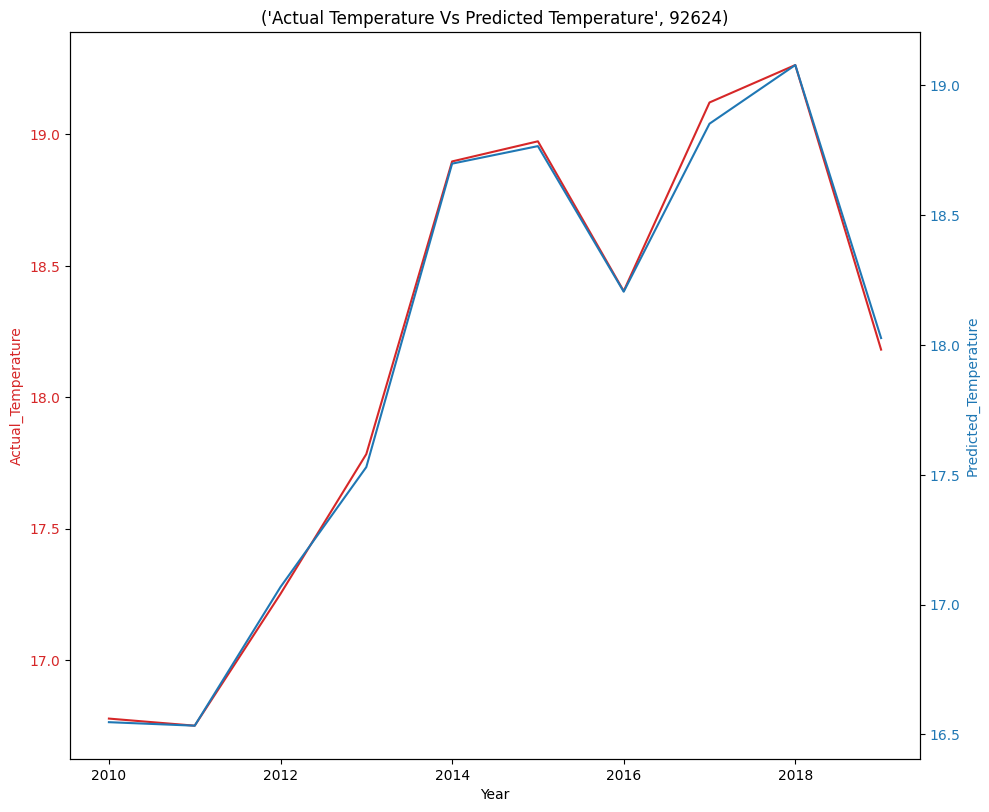

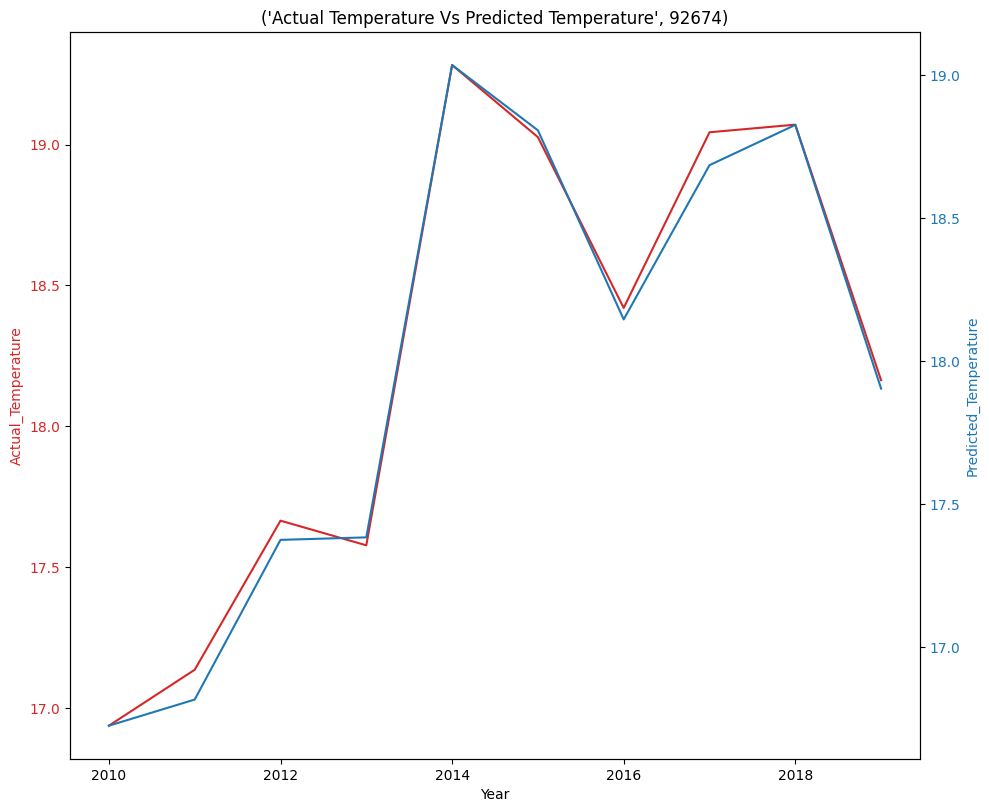

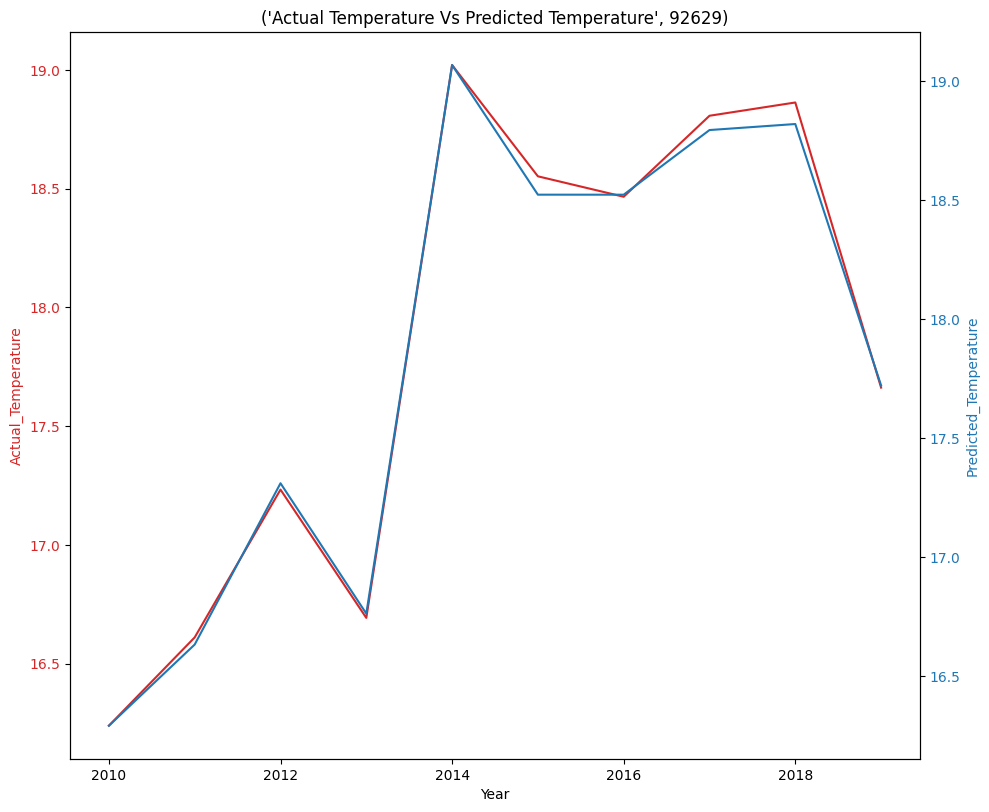

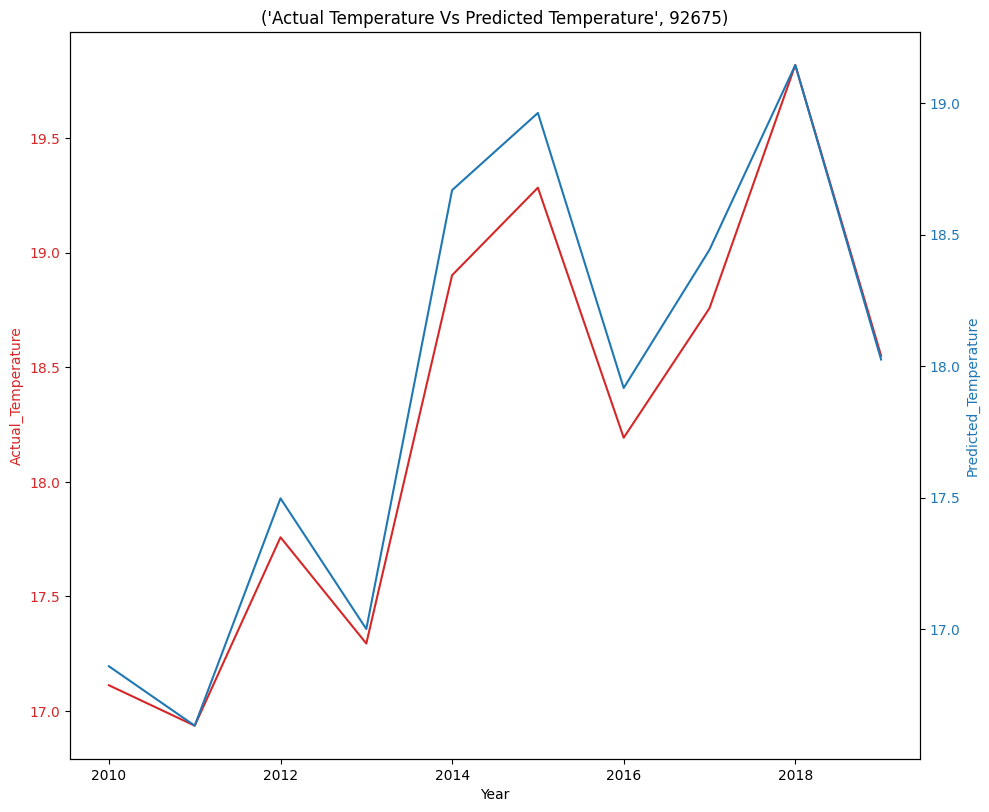

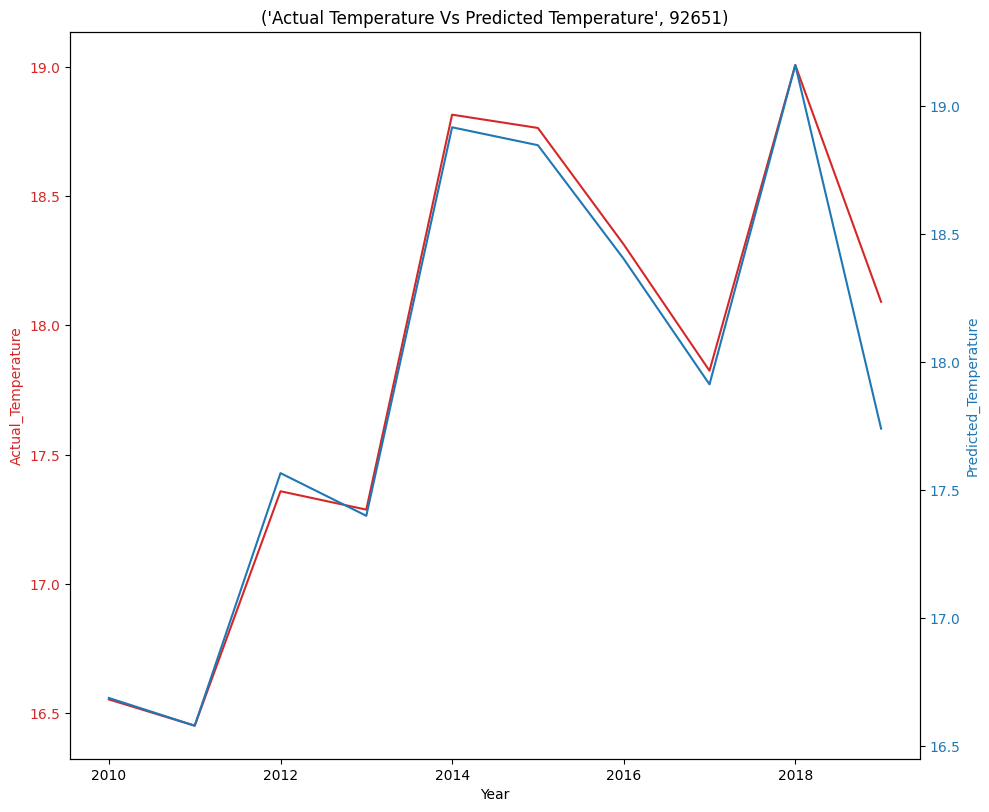

...

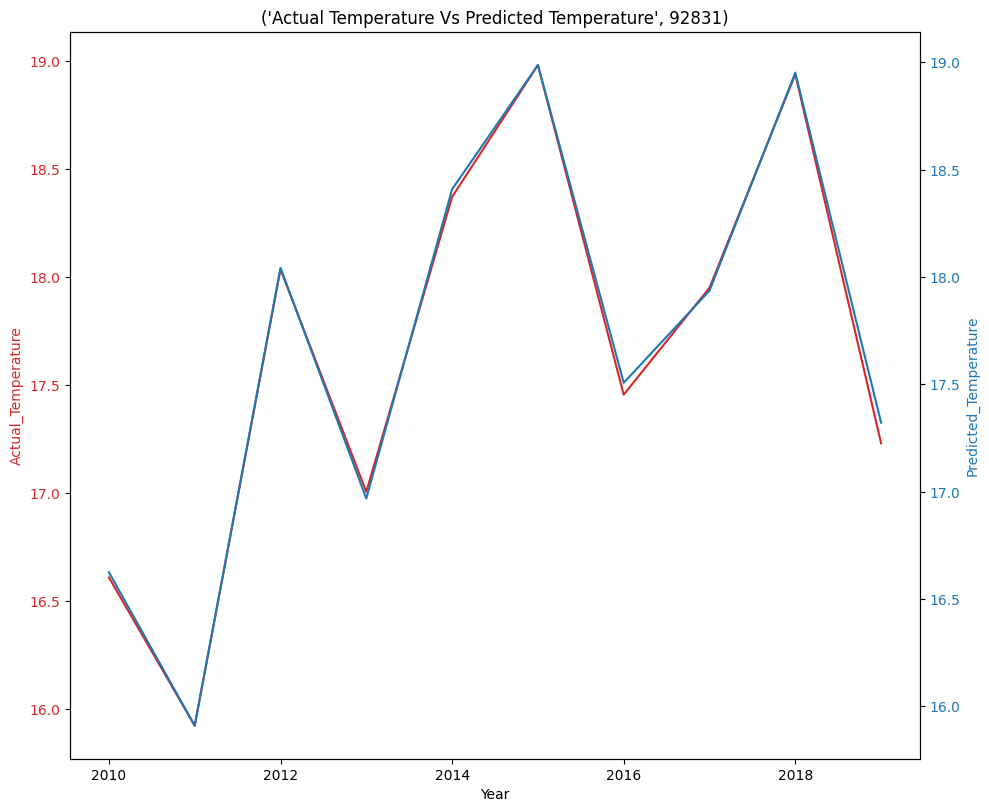

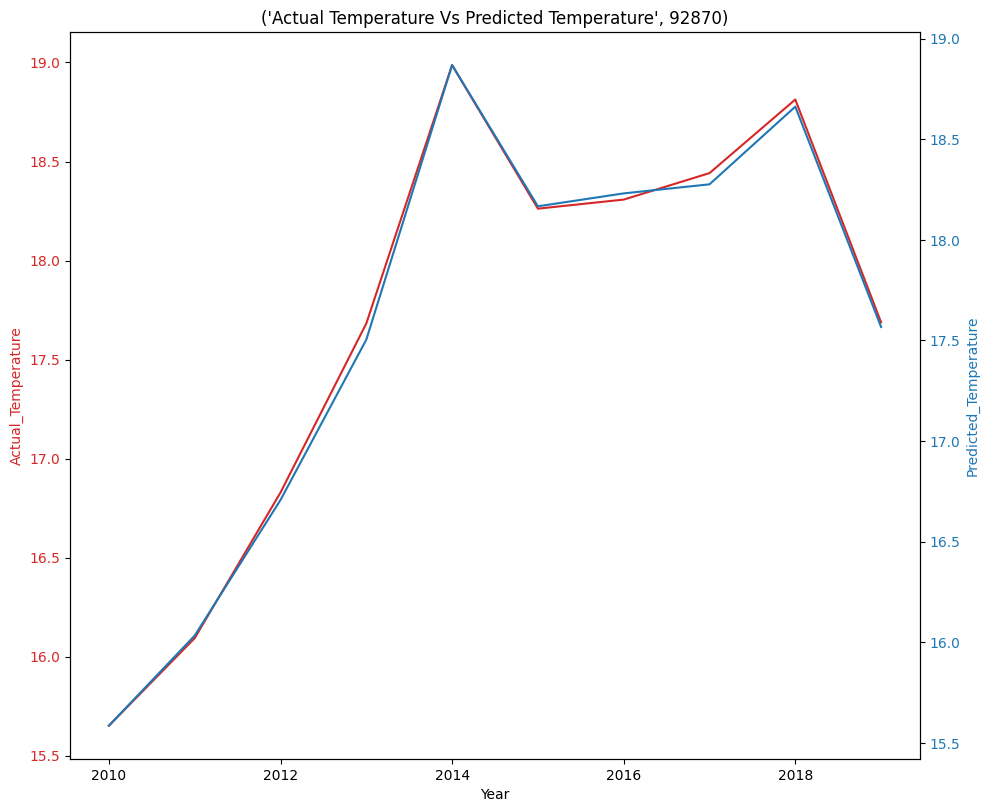

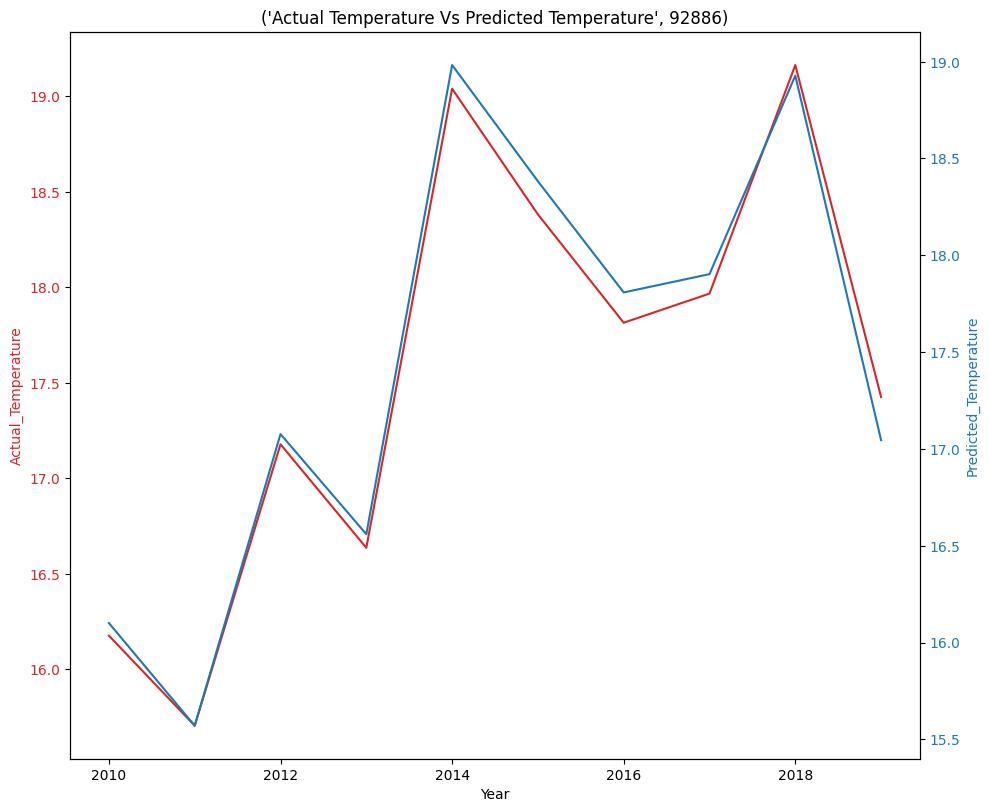

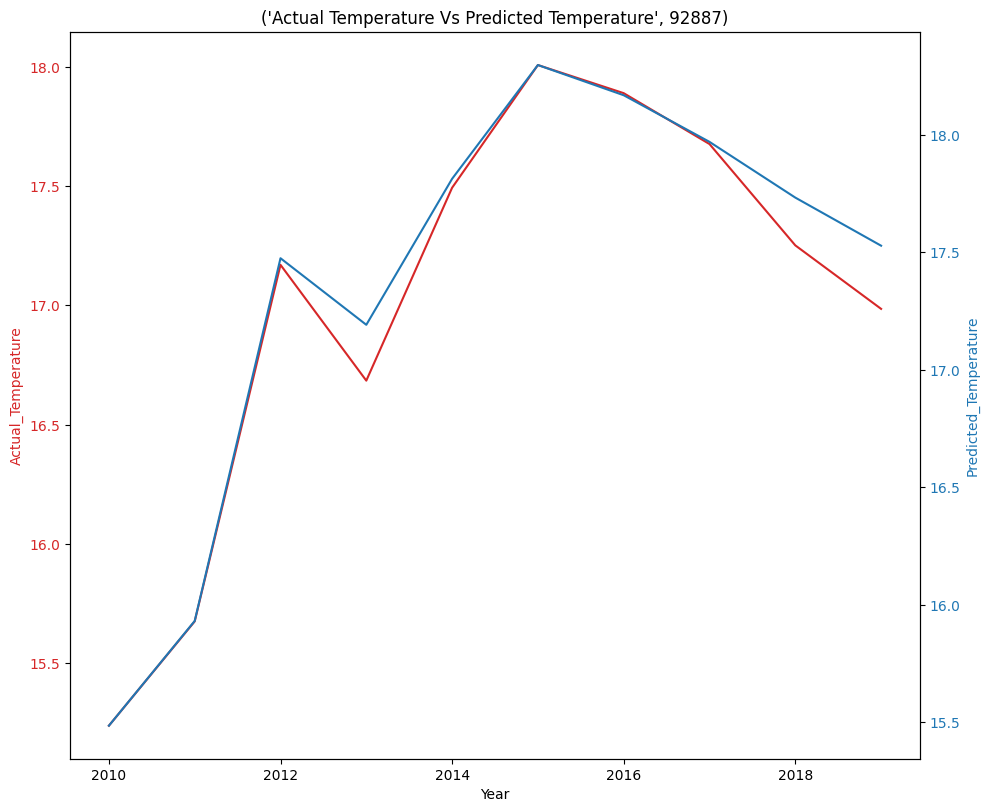

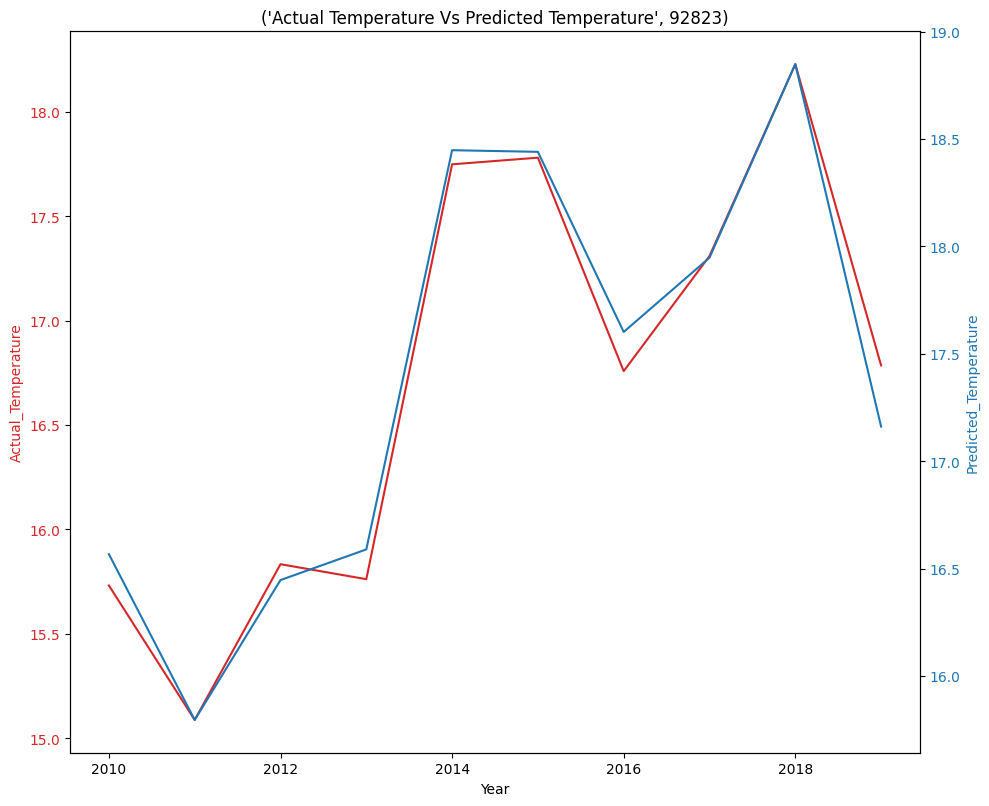

In [ ]:
import matplotlib.pyplot as plt # Import the relevant module
#plt.figure(figsize=(10,8), dpi=100)

 # Create the figure and axes object
for i in zip_code:
    fig, ax1 = plt.subplots(figsize=(10,8), dpi=100)
    mask = (dat6["Zipcode"] == i)
    dat7 = dat6.loc[mask]
    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Actual_Temperature', color=color)
    ax1.plot(dat7.index, dat7.Actual_Temperature, color=color)
    ax1.tick_params(axis='y', labelcolor=color)
    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    color = 'tab:blue'
    ax2.set_ylabel('Predicted_Temperature', color=color)  # we already handled the x-label with ax1
    ax2.plot(dat7.index, dat7.Predicted_Temperature, color=color)
    ax2.tick_params(axis='y', labelcolor=color)
    fig.tight_layout()  # otherwise the right y-label is slightly clipped
    plt.gca().set(title=('Actual Temperature Vs Predicted Temperature', i))
    plt.show()
    


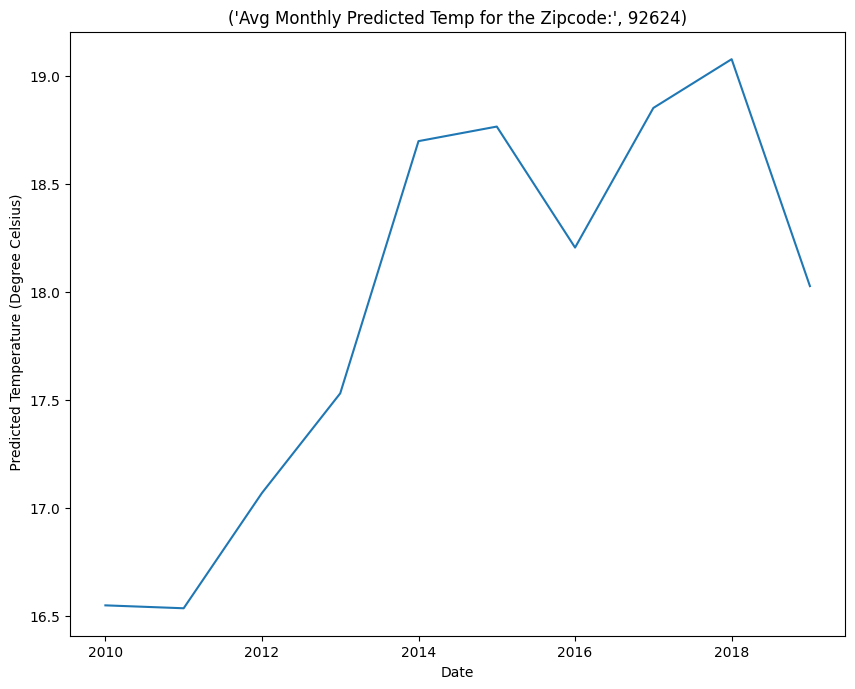

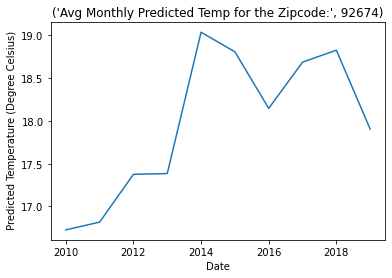

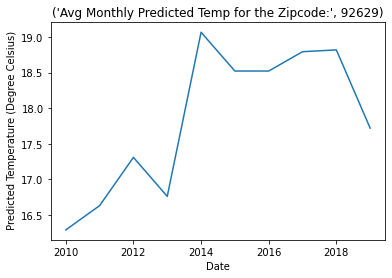

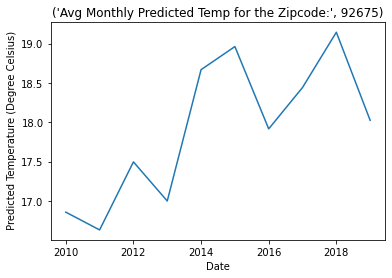

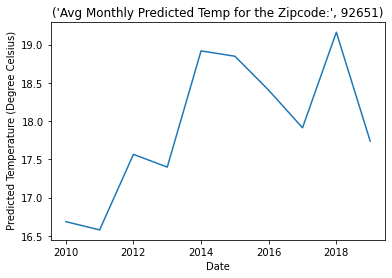

...

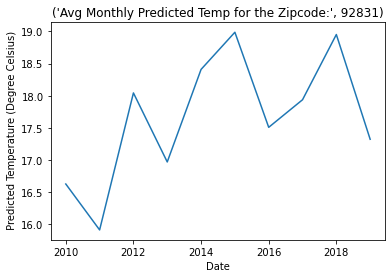

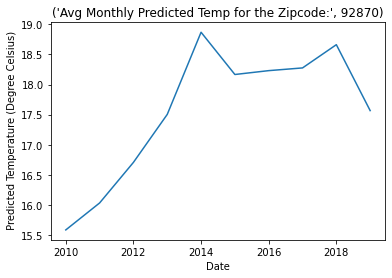

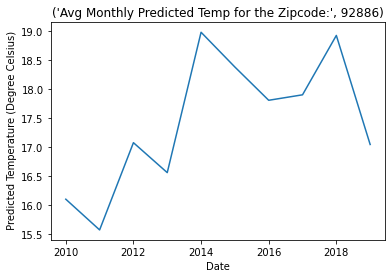

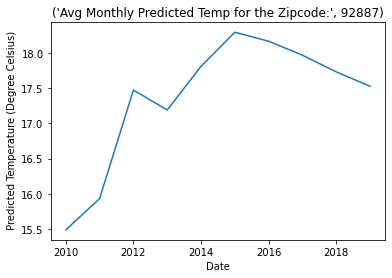

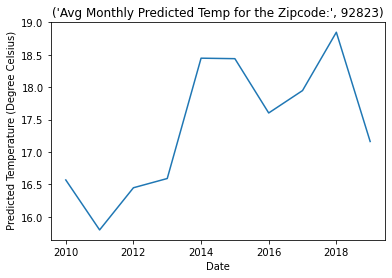

In [ ]:
plt.figure(figsize=(10,8), dpi=100)
for i in zip_code:
    mask = (dat6["Zipcode"] == i)
    dat8 = dat6.loc[mask]
    plt.plot(dat8.index, dat8.Predicted_Temperature, color='tab:blue')
    plt.gca().set(title=('Avg Monthly Predicted Temp for the Zipcode:', i), xlabel='Date', ylabel=" Predicted Temperature (Degree Celsius)")
    plt.show()
    i = i + 1

In [ ]:
dat6['Percentage_diff'] = dat6['Predicted_Temperature'].pct_change()
dat6.head()

,Zipcode,Predicted_Temperature,Actual_Temperature,Percentage_diff
year,,,,
2010,90620,16.275862,16.406897,NaN
2011,90620,16.459459,16.533784,0.011280
2012,90620,17.569536,17.649007,0.067443
2013,90620,17.134752,17.226950,-0.024747
2014,90620,18.341772,18.493671,0.070443


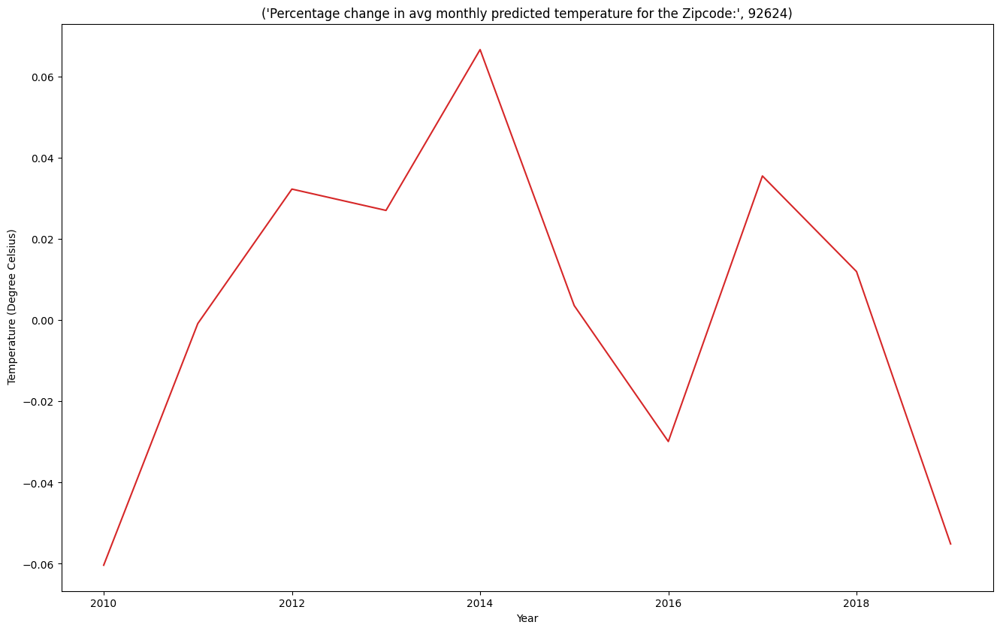

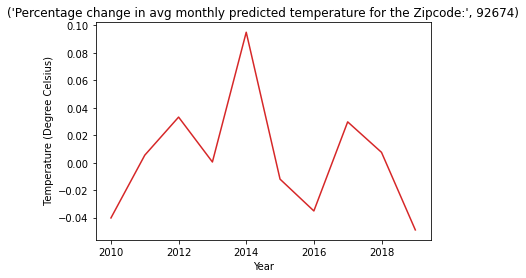

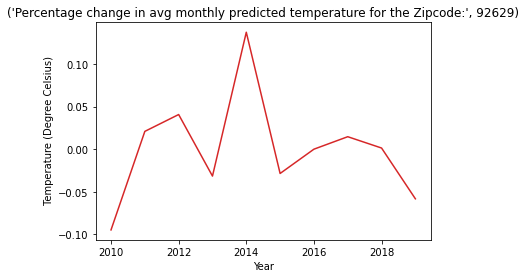

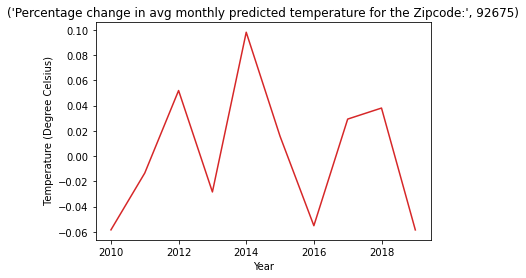

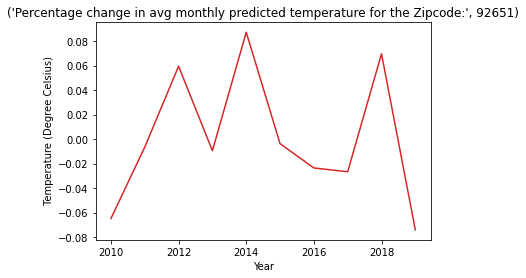

...

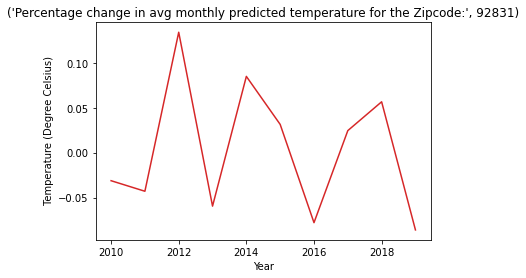

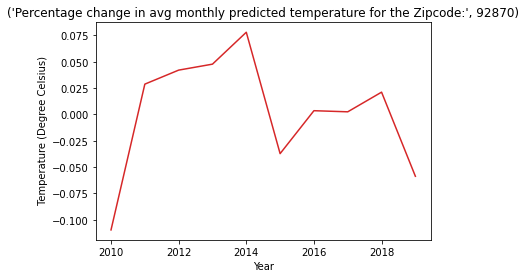

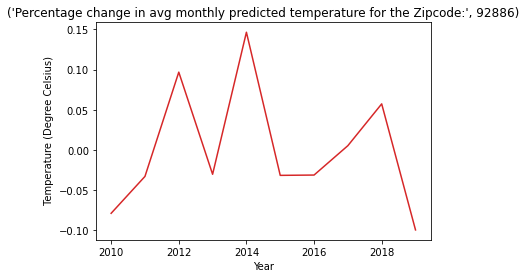

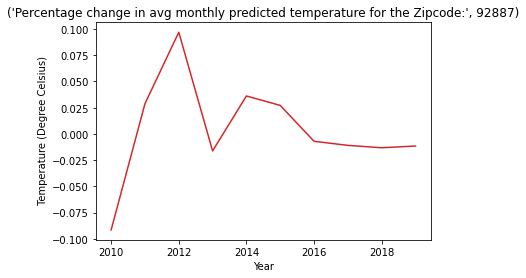

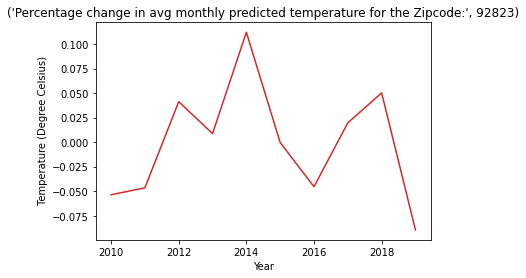

In [ ]:
plt.figure(figsize=(16,10), dpi=100)
for i in zip_code:
    mask = (dat6["Zipcode"] == i)
    dat8 = dat6.loc[mask]
    plt.plot(dat8.index, dat8.Percentage_diff, color='tab:red')
    plt.gca().set(title=('Percentage change in avg monthly predicted temperature for the Zipcode:', i), xlabel='Year', ylabel=" Temperature (Degree Celsius)")
    plt.show()
    i = i + 1

In [ ]:
import datetime as dt
from scipy import stats

In [ ]:
Graph_Plot.dtypes

Zipcode                           int32
Precipitable_Water                int32
Wind_Speed                        int32
Wind_Direction                    int32
Date                     datetime64[ns]
Actual_Temperature                int32
Predicted_Temperature             int32
year                      period[A-DEC]
dtype: object

In [ ]:
Graph_Plot['month_year']= Graph_Plot.month_year.values.astype('datetime64[M]')

In [ ]:
#To find the slope of the graph between Date and Predicted Temperature

import datetime as dt
from scipy import stats

#df = pd.DataFrame(list, columns=['date', 'value'])
#Graph_Plot.month_year =pd.to_datetime(Graph_Plot.month_year)
Graph_Plot['date_ordinal'] = pd.to_datetime(Graph_Plot['month_year']).map(dt.datetime.toordinal)
slope, intercept, r_value, p_value, std_err = stats.linregress(Graph_Plot['date_ordinal'], Graph_Plot['Predicted_Temperature'])


In [ ]:
print(slope, intercept, r_value, p_value, std_err)

0.0007499870638195087 -534.0685573218703 0.17093970375912879 0.0 1.361991784849582e-05


In [ ]:
#Future Temperature Predictions Code

data_file = pd.DataFrame(columns = ["ZipCode", "Year", "Month", "Day"])

In [ ]:
#Populating values for the Zipcode
value= 12*25
#out= [x for i, j in zip(zip_code, mon) for x in i*j]

import numpy as np
zip_rep = np.repeat(zip_code, value).tolist()

data_file['ZipCode'] = zip_rep

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day
0,92624,NaN,NaN,NaN
1,92624,NaN,NaN,NaN
2,92624,NaN,NaN,NaN
3,92624,NaN,NaN,NaN
4,92624,NaN,NaN,NaN


In [ ]:
data_file.shape

(20700, 4)

In [ ]:
zipunique = data_file['ZipCode'].unique

In [ ]:
#Populating values for the Year column of data_file
rnge = 2021, 2022, 2023, 2024, 2025, 2026, 2027, 2028, 2029, 2030, 2031, 2032, 2033, 2034, 2035, 2036, 2037, 2038, 2039, 2040, 2041, 2042, 2043, 2044, 2045


In [ ]:
value= 12
import numpy as np
for j in rnge:
        year_rep = np.repeat(rnge, value).tolist()


In [ ]:
print(year_rep)


[2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2022, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2023, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2024, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2025, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2026, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2027, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2028, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2029, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2030, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2031, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2032, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2033, 2034, 2034, 2034, 2034, 2034, 2034, 2034, 2034, 2034, 2034, 203

In [ ]:
data_file['Year'] = np.tile(year_rep, len(data_file)//len(year_rep))

In [ ]:
data_file['Year'].head(15)

0     2021
1     2021
2     2021
3     2021
4     2021
5     2021
6     2021
7     2021
8     2021
9     2021
10    2021
11    2021
12    2022
13    2022
14    2022
Name: Year, dtype: int32

In [ ]:
#Populating values for month column of data_file
list_int = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

data_file['Month'] = np.tile(list_int, len(data_file)//len(list_int))

In [ ]:
data_file.head(24)

,ZipCode,Year,Month,Day
0,92624,2021,1,NaN
1,92624,2021,2,NaN
2,92624,2021,3,NaN
3,92624,2021,4,NaN
4,92624,2021,5,NaN
5,92624,2021,6,NaN
6,92624,2021,7,NaN
7,92624,2021,8,NaN
8,92624,2021,9,NaN
9,92624,2021,10,NaN


In [ ]:
#Assigning Day as 1 to the day column of data_file
data_file = data_file.assign(Day = 1)

#df = df.assign(industry='yyy')

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day
0,92624,2021,1,1
1,92624,2021,2,1
2,92624,2021,3,1
3,92624,2021,4,1
4,92624,2021,5,1


In [ ]:
#Adding the Date column
data_file['Date'] = data_file.apply(to_integer, axis= 1)

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day,Date
0,92624,2021,1,1,20210101
1,92624,2021,2,1,20210201
2,92624,2021,3,1,20210301
3,92624,2021,4,1,20210401
4,92624,2021,5,1,20210501


In [ ]:
data_file.dtypes

ZipCode    int64
Year       int32
Month      int32
Day        int64
Date       int64
dtype: object

In [ ]:
data_file['Date'] =  pd.to_datetime(data_file['Date'], format = '%Y%m%d')

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day,Date
0,92624,2021,1,1,2021-01-01
1,92624,2021,2,1,2021-02-01
2,92624,2021,3,1,2021-03-01
3,92624,2021,4,1,2021-04-01
4,92624,2021,5,1,2021-05-01


In [ ]:
data_file.dtypes

ZipCode             int64
Year                int32
Month               int32
Day                 int64
Date       datetime64[ns]
dtype: object

In [ ]:
data_file.reset_index('Date', inplace = True)

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day,Date
0,92624,2021,1,1,2021-01-01
1,92624,2021,2,1,2021-02-01
2,92624,2021,3,1,2021-03-01
3,92624,2021,4,1,2021-04-01
4,92624,2021,5,1,2021-05-01


In [ ]:
#To gather the average temperature of 2019 Data for predictions
pred_cal_df =merge_data.copy()
pred_cal_df.head()
pred_cal_df = pred_cal_df.astype(int)


In [ ]:
pred_cal_df.head()

,Zipcode,Precipitable_Water,Wind_Speed,Wind_Direction,Date,Actual_Temperature,Predicted_Temperature
0,92629,1,2,222,20100313,12,12
1,92625,0,7,299,20100429,13,13
2,92845,2,1,203,20101215,12,12
3,92807,1,1,168,20190812,23,23
4,92808,0,2,46,20100327,14,14


In [ ]:
pred_cal_df['Date'] =  pd.to_datetime(pred_cal_df['Date'], format = '%Y%m%d')

In [ ]:
#To select all the data between 2019-01 to 2019-31
mask = (pred_cal_df['Date'] > '2019-01-01') & (pred_cal_df['Date'] <= '2019-12-31')
pred_cal_df.loc[mask]
pred_cal_df1 = pred_cal_df.loc[mask]

In [ ]:
pred_cal_df1.head(12)

,Zipcode,Precipitable_Water,Wind_Speed,Wind_Direction,Date,Actual_Temperature,Predicted_Temperature
3,92807,1,1,168,2019-08-12,23,23
13,92866,1,3,275,2019-03-08,11,10
17,92707,1,1,223,2019-07-12,24,23
18,92626,1,1,198,2019-06-08,19,19
26,92630,1,2,242,2019-02-09,10,10
48,92806,2,1,165,2019-12-13,16,16
78,92602,1,2,256,2019-06-23,21,20
79,92807,1,1,181,2019-05-31,16,16
81,92674,1,1,147,2019-10-22,26,25
94,92870,1,2,247,2019-05-05,15,15


In [ ]:
df3 = (pred_cal_df1.groupby(['Zipcode', pd.Grouper(key='Date', freq = 'MS')])['Actual_Temperature']
                      .mean()
                      .reset_index(level=[0]))

In [ ]:
df3.head(13)

,Zipcode,Actual_Temperature
Date,,
2019-01-01,90620,13.733333
2019-02-01,90620,10.500000
2019-03-01,90620,14.500000
2019-04-01,90620,15.916667
2019-05-01,90620,15.692308
2019-06-01,90620,20.166667
2019-07-01,90620,23.846154
2019-08-01,90620,24.142857
2019-09-01,90620,23.823529


In [ ]:
df3.reset_index(inplace=True)

In [ ]:
df3.head()

,Date,Zipcode,Actual_Temperature
0,2019-01-01,90620,13.733333
1,2019-02-01,90620,10.500000
2,2019-03-01,90620,14.500000
3,2019-04-01,90620,15.916667
4,2019-05-01,90620,15.692308


In [ ]:
df3.dtypes

Date                  datetime64[ns]
Zipcode                        int64
Actual_Temperature           float64
dtype: object

In [ ]:
import datetime

#build temperatures dictionary
temperatures = {}
for row in df3.itertuples():
    key =(row.Date, row.Zipcode)
    val = row.Actual_Temperature
    temperatures[key] = val

In [ ]:
print(temperatures)

{(Timestamp('2019-01-01 00:00:00'), 90620): 13.733333333333333, (Timestamp('2019-02-01 00:00:00'), 90620): 10.5, (Timestamp('2019-03-01 00:00:00'), 90620): 14.5, (Timestamp('2019-04-01 00:00:00'), 90620): 15.916666666666666, (Timestamp('2019-05-01 00:00:00'), 90620): 15.692307692307692, (Timestamp('2019-06-01 00:00:00'), 90620): 20.166666666666668, (Timestamp('2019-07-01 00:00:00'), 90620): 23.846153846153847, (Timestamp('2019-08-01 00:00:00'), 90620): 24.142857142857142, (Timestamp('2019-09-01 00:00:00'), 90620): 23.823529411764707, (Timestamp('2019-10-01 00:00:00'), 90620): 20.76923076923077, (Timestamp('2019-11-01 00:00:00'), 90620): 16.733333333333334, (Timestamp('2019-12-01 00:00:00'), 90620): 12.75, (Timestamp('2019-01-01 00:00:00'), 90621): 13.23076923076923, (Timestamp('2019-02-01 00:00:00'), 90621): 10.384615384615385, (Timestamp('2019-03-01 00:00:00'), 90621): 13.375, (Timestamp('2019-04-01 00:00:00'), 90621): 16.416666666666668, (Timestamp('2019-05-01 00:00:00'), 90621): 15.

In [ ]:
data_file.head()

,ZipCode,Year,Month,Day,Date
0,92624,2021,1,1,2021-01-01
1,92624,2021,2,1,2021-02-01
2,92624,2021,3,1,2021-03-01
3,92624,2021,4,1,2021-04-01
4,92624,2021,5,1,2021-05-01


In [ ]:
#calculate future temperature
predicted = []
for row in data_file.itertuples():
    source_date = datetime.datetime(2019,row.Month,1)
    source_temperature = temperatures[(source_date, row.ZipCode)]
    number_of_years = row.Year - 2019
    predicted_temperature = source_temperature+ (number_of_years * 0.0007499870638195087)
    predicted.append(predicted_temperature)

print(predicted)


[14.668166640794306, 12.274227246854913, 14.668166640794306, 17.10149997412764, 16.70149997412764, 19.58973526824529, 22.215785688413355, 23.80149997412764, 24.09240906503673, 20.924576897204563, 18.287214259841925, 13.75149997412764, 14.668916627858124, 12.274977233918731, 14.668916627858124, 17.10224996119146, 16.70224996119146, 19.59048525530911, 22.216535675477175, 23.80224996119146, 24.09315905210055, 20.925326884268383, 18.287964246905744, 13.752249961191458, 14.669666614921944, 12.275727220982551, 14.669666614921944, 17.10299994825528, 16.70299994825528, 19.591235242372928, 22.217285662540995, 23.80299994825528, 24.09390903916437, 20.926076871332203, 18.288714233969564, 13.752999948255278, 14.670416601985764, 12.276477208046371, 14.670416601985764, 17.103749935319097, 16.703749935319095, 19.591985229436744, 22.21803564960481, 23.803749935319097, 24.094659026228186, 20.92682685839602, 18.28946422103338, 13.753749935319098, 14.671166589049584, 12.277227195110191, 14.67116658904958

In [ ]:
data_file['Predicted_Temperature'] = predicted

In [ ]:
data_file.head(15)

,ZipCode,Year,Month,Day,Date,Predicted_Temperature
0,92624,2021,1,1,2021-01-01,14.668167
1,92624,2021,2,1,2021-02-01,12.274227
2,92624,2021,3,1,2021-03-01,14.668167
3,92624,2021,4,1,2021-04-01,17.101500
4,92624,2021,5,1,2021-05-01,16.701500
5,92624,2021,6,1,2021-06-01,19.589735
6,92624,2021,7,1,2021-07-01,22.215786
7,92624,2021,8,1,2021-08-01,23.801500
8,92624,2021,9,1,2021-09-01,24.092409
9,92624,2021,10,1,2021-10-01,20.924577


In [ ]:
#Save the data_file in csv format
data_file.to_csv('Future_Predicted_Temperatures.csv', index = False)